# Problem 1

- by Nakul Havaldar

In [33]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tarfile
import os
import pickle
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.initializers import he_normal
from tensorflow.keras.initializers import he_normal
from tensorflow.keras.optimizers import Adam
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization
from keras.initializers import he_normal

In [34]:
s, sr=librosa.load('train_clean_male.wav', sr=None)
S=librosa.stft(s, n_fft=1024, hop_length=512)
sn, sr=librosa.load("train_dirty_male.wav", sr=None)
X=librosa.stft(sn, n_fft=1024, hop_length=512)

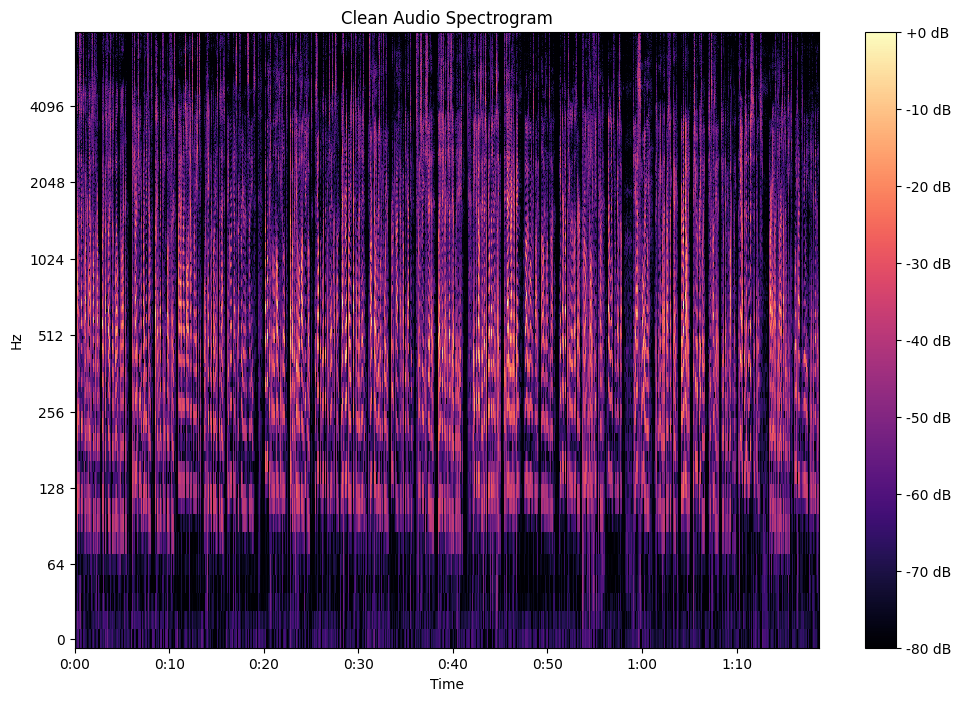

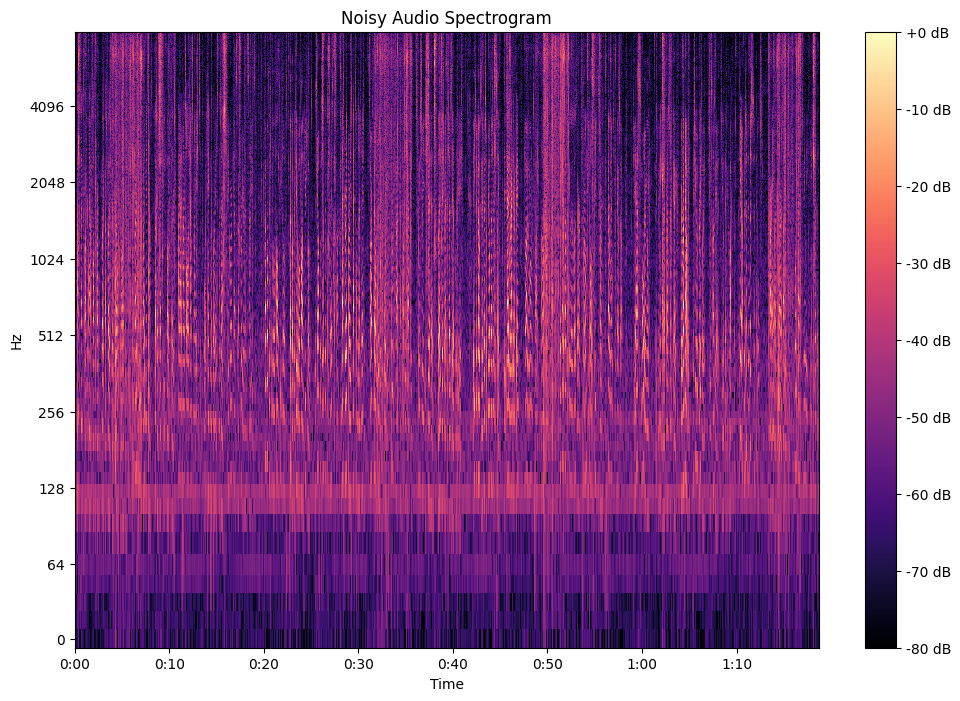

In [35]:
plt.figure(figsize=(12, 8))
librosa.display.specshow(librosa.amplitude_to_db(abs(S), ref=np.max), sr=sr, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Clean Audio Spectrogram')
plt.show()

# Visualize the magnitude spectrogram for the noisy audio signal X
plt.figure(figsize=(12, 8))
librosa.display.specshow(librosa.amplitude_to_db(abs(X), ref=np.max), sr=sr, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Noisy Audio Spectrogram')
plt.show()

In [36]:
mod_S = np.abs(S)
mod_X = np.abs(X)

In [37]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization

# Define the neural network model with ReLU activation in all layers
model_one = Sequential([
    Dense(512, input_shape=(513,), activation='relu', kernel_initializer=he_normal()),
    Dense(256, activation='relu', kernel_initializer=he_normal()),
    BatchNormalization(),
    Dense(128, activation='relu', kernel_initializer=he_normal()),
    BatchNormalization(),
    Dense(513, activation='relu', kernel_initializer=he_normal())
])

# Compile the model
model_one.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

# Print the model summary
model_one.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 512)               263168    
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 batch_normalization (Batch  (None, 256)               1024      
 Normalization)                                                  
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 batch_normalization_1 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dense_7 (Dense)             (None, 513)              

In [38]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization

# Define the neural network model with tanh activation in all layers
model_two = Sequential([
    Dense(512, input_shape=(513,), activation='tanh', kernel_initializer=he_normal()),
    Dense(256, activation='tanh', kernel_initializer=he_normal()),
    BatchNormalization(),
    Dense(128, activation='tanh', kernel_initializer=he_normal()),
    BatchNormalization(),
    Dense(513, activation='tanh', kernel_initializer=he_normal())
])

# Compile the model
model_two.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

# Print the model summary
model_two.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 512)               263168    
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                                 
 batch_normalization_2 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dense_10 (Dense)            (None, 128)               32896     
                                                                 
 batch_normalization_3 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dense_11 (Dense)            (None, 513)              

In [40]:
history_one = model_one.fit(mod_X.T, mod_S.T, epochs=300, batch_size=64)


Epoch 1/300
39/39 [==============================] - 0s 5ms/step - loss: 0.0113 - accuracy: 0.3855
Epoch 2/300
39/39 [==============================] - 0s 5ms/step - loss: 0.0107 - accuracy: 0.3815
Epoch 3/300
39/39 [==============================] - 0s 5ms/step - loss: 0.0101 - accuracy: 0.3920
Epoch 4/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 0.3957
Epoch 5/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0102 - accuracy: 0.4006
Epoch 6/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0095 - accuracy: 0.4046
Epoch 7/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0095 - accuracy: 0.4046
Epoch 8/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0096 - accuracy: 0.3949
Epoch 9/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0104 - accuracy: 0.4006
Epoch 10/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0103 - accuracy: 0.3961
Epoch 11/

In [41]:
history_two = model_two.fit(mod_X.T, mod_S.T, epochs=300, batch_size=64)

Epoch 1/300
39/39 [==============================] - 2s 4ms/step - loss: 0.3185 - accuracy: 0.0240
Epoch 2/300
39/39 [==============================] - 0s 4ms/step - loss: 0.1068 - accuracy: 0.0366
Epoch 3/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0842 - accuracy: 0.0415
Epoch 4/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0789 - accuracy: 0.0602
Epoch 5/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0768 - accuracy: 0.0655
Epoch 6/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0751 - accuracy: 0.0671
Epoch 7/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0737 - accuracy: 0.0679
Epoch 8/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0729 - accuracy: 0.0724
Epoch 9/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0723 - accuracy: 0.0760
Epoch 10/300
39/39 [==============================] - 0s 4ms/step - loss: 0.0712 - accuracy: 0.0777
Epoch 11/

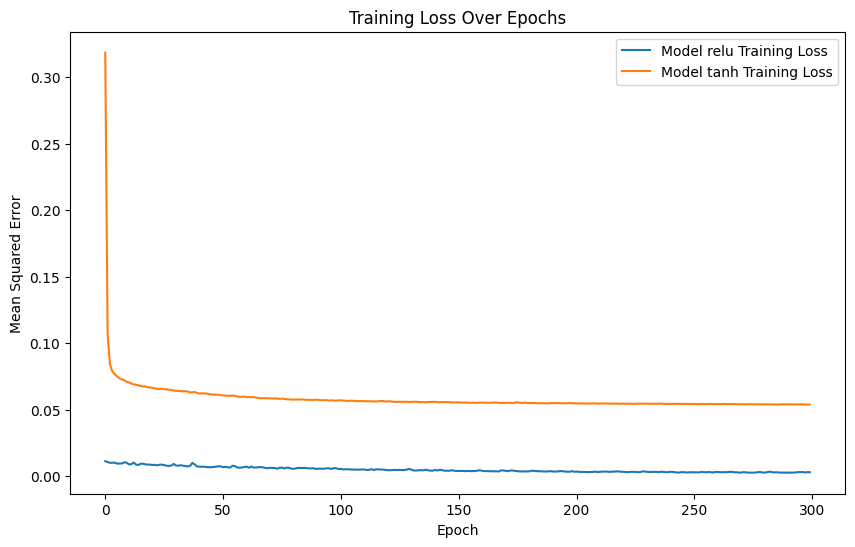

In [42]:
plt.figure(figsize=(10, 6))

# Plot the training loss for the first model with a label
plt.plot(history_one.history['loss'], label='Model relu Training Loss')

# Plot the training loss for the second model with a label
plt.plot(history_two.history['loss'], label='Model tanh Training Loss')

plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')

# Add a legend based on the labels provided in the plot functions
plt.legend()

plt.show()




1.   I tried two models here one with Relu activation and the other with tanh activation as it is clearly seen that the one with the relu activation worked better so going ahead with it for denoisisng process.

2.   I had run it once and then the SNR was 9.1, now it is coming different. I think the reason is due to the initialization methods.
3. I also tried running for more epcohs but then the model starts to overfit to 300 epoch was a sweet number I decided to stick with, which give me fairly decent resutls.



In [44]:
f, sr=librosa.load('test_x_01.wav', sr=None)
test_X =librosa.stft(f, n_fft=1024, hop_length=512)

In [45]:
mod_test_X  = abs(test_X)

## SNR

In [46]:
S_test_cleaned = model_one.predict(mod_test_X.T)

5/5 [==============================] - 0s 2ms/step


In [47]:
S_test = np.multiply((test_X)/ mod_test_X, S_test_cleaned.T)

In [48]:
n_fft = 1024
hop_length = 512


# Reconstruct the time-domain signal using inverse STFT
reconstructed_signal = librosa.istft(S_test, hop_length=hop_length, win_length=n_fft)

In [49]:
import soundfile as sf

# Output file path for the denoised audio
output_file_path = 'denoised_output.wav'

# Write the denoised audio signal to a WAV file
sf.write(output_file_path, reconstructed_signal, sr)

In [50]:
g, sr=librosa.load('test_s_01.wav', sr=None)
clean_S =librosa.stft(g, n_fft=1024, hop_length=512)

In [51]:

inverse_S_clean = librosa.istft(clean_S, hop_length=hop_length, win_length=n_fft)

In [53]:

SNR = 10 * np.log10(np.sum((inverse_S_clean ** 2)) / np.sum((inverse_S_clean - reconstructed_signal) ** 2)+ 1e-20)
print("Signal-to-Noise Ratio (SNR): {:.2f} dB".format(SNR))

Signal-to-Noise Ratio (SNR): 8.58 dB


In [56]:
from IPython.display import Audio

# Play the Noisy Speech
display(Audio(s, rate=sr))

# Play the Recovered Speech
display(Audio(reconstructed_signal, rate=sr))

# Play the Clean Speech
display(Audio(g, rate=sr))

## testing clean speech using denoising

In [61]:
final_audio,sr = librosa.load('test_x_02.wav', sr=None)
final_stft = librosa.stft(final_audio, n_fft=1024, hop_length=512)
final_abs = np.abs(final_stft)
final_audio_denoised = model_one.predict(final_abs.T)

recovered = (final_stft/final_abs)*final_audio_denoised.T

recover_final = librosa.istft(recovered, hop_length=512)

12/12 [==============================] - 0s 1ms/step


#### Noisy test speech

In [60]:
display(Audio(final_audio, rate=sr))

### Denoised speech recovered

In [64]:
display(Audio(recover_final, rate=sr))

In [65]:

sf.write('recovered_final.wav', recover_final, sr)


Conclusion:

*   The chip noise has been removed but there is some other kind of noise still present.
* With more fine tuning and more data the model's perfromance can be improved.



# Q2 : using convolution

In [57]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Flatten, Dense

# Define the neural network model with Conv1D layers
model_three = Sequential([
    Conv1D(filters=32, kernel_size=3, strides=2, activation='relu', input_shape=(513, 1)),
    Conv1D(filters=64, kernel_size=3, strides=2, activation='relu'),
    Flatten(),
    Dense(513, activation='relu', kernel_initializer=he_normal()),

])

# Compile the model
model_three.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

# Print the model summary
model_three.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 256, 32)           128       
                                                                 
 conv1d_1 (Conv1D)           (None, 127, 64)           6208      
                                                                 
 flatten_2 (Flatten)         (None, 8128)              0         
                                                                 
 dense_12 (Dense)            (None, 513)               4170177   
                                                                 
Total params: 4176513 (15.93 MB)
Trainable params: 4176513 (15.93 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [67]:
history = model_three.fit(mod_X.T, mod_S.T, epochs=300, batch_size=32)

Epoch 1/300
77/77 [==============================] - 0s 4ms/step - loss: 0.0010 - accuracy: 0.7422
Epoch 2/300
77/77 [==============================] - 0s 3ms/step - loss: 9.8063e-04 - accuracy: 0.7544
Epoch 3/300
77/77 [==============================] - 0s 3ms/step - loss: 9.7722e-04 - accuracy: 0.7462
Epoch 4/300
77/77 [==============================] - 0s 3ms/step - loss: 9.3886e-04 - accuracy: 0.7601
Epoch 5/300
77/77 [==============================] - 0s 3ms/step - loss: 9.2916e-04 - accuracy: 0.7637
Epoch 6/300
77/77 [==============================] - 0s 3ms/step - loss: 9.2372e-04 - accuracy: 0.7613
Epoch 7/300
77/77 [==============================] - 0s 3ms/step - loss: 9.2051e-04 - accuracy: 0.7654
Epoch 8/300
77/77 [==============================] - 0s 3ms/step - loss: 9.4527e-04 - accuracy: 0.7552
Epoch 9/300
77/77 [==============================] - 0s 3ms/step - loss: 9.4029e-04 - accuracy: 0.7560
Epoch 10/300
77/77 [==============================] - 0s 3ms/step - loss: 9.3

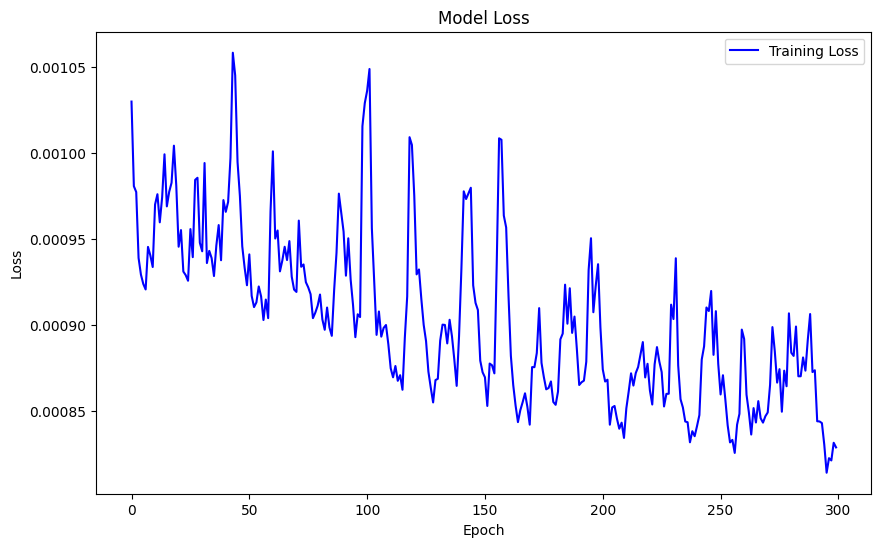

In [68]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [70]:
S_test_cleaned = model_three.predict(mod_test_X.T)

5/5 [==============================] - 0s 2ms/step


In [71]:
S_test = np.multiply((test_X)/ mod_test_X, S_test_cleaned.T)

In [72]:
n_fft = 1024
hop_length = 512


# Reconstruct the time-domain signal using inverse STFT
reconstructed_signal = librosa.istft(S_test, hop_length=hop_length, win_length=n_fft)

In [73]:
import soundfile as sf

# Output file path for the denoised audio
output_file_path = 'denoised_output.wav'

# Write the denoised audio signal to a WAV file
sf.write(output_file_path, reconstructed_signal, sr)

In [74]:
g, sr=librosa.load('test_s_01.wav', sr=None)
clean_S =librosa.stft(g, n_fft=1024, hop_length=512)

In [75]:

inverse_S_clean = librosa.istft(clean_S, hop_length=hop_length, win_length=n_fft)

In [76]:

SNR = 10 * np.log10(np.sum((inverse_S_clean ** 2)) / np.sum((inverse_S_clean - reconstructed_signal) ** 2)+ 1e-20)
print("Signal-to-Noise Ratio (SNR): {:.2f} dB".format(SNR))

Signal-to-Noise Ratio (SNR): 11.36 dB


In [77]:
from IPython.display import Audio

# Play the Noisy Speech
display(Audio(s, rate=sr))

# Play the Recovered Speech
display(Audio(reconstructed_signal, rate=sr))

# Play the Clean Speech
display(Audio(g, rate=sr))

## testing clean speech using denoising

In [78]:
final_audio,sr = librosa.load('test_x_02.wav', sr=None)
final_stft = librosa.stft(final_audio, n_fft=1024, hop_length=512)
final_abs = np.abs(final_stft)
final_audio_denoised = model_three.predict(final_abs.T)

recovered = (final_stft/final_abs)*final_audio_denoised.T

recover_final = librosa.istft(recovered, hop_length=512)

12/12 [==============================] - 0s 3ms/step


#### Noisy test speech

In [79]:
display(Audio(final_audio, rate=sr))

### Denoised speech recovered

In [80]:
display(Audio(recover_final, rate=sr))

In [81]:

sf.write('recovered_final_cnn.wav', recover_final, sr)

## Conclusions:
* Using CNN is better for this kind of denoising processing. With this method the SNR was better from 8.6 in the previous normal NN to now 11.36 dB.
* Essentially a 1D NN is able to identify the patterns more clearly with the given architechre. Different experimentations were done and I have chosen this model which perfomrs well and doesnt overfit.

# Problem 3 :

In [4]:
from google.colab import files
import io
import pickle
import numpy as np

# Upload the CIFAR-10 dataset files to Colab
uploaded = files.upload()

In [7]:
# Load CIFAR-10 training data
X_train_all = []
y_train_all = []

# Load all 5 data batches
for i in range(1, 6):  # data_batch_1 to data_batch_5
    with open((f'data_batch_{i}'), 'rb') as file:
        batch = pickle.load(file, encoding='latin1')
        X_train_batch = batch['data']
        y_train_batch = batch['labels']

        X_train_all.append(X_train_batch)
        y_train_all.append(y_train_batch)

# Concatenate all batches into a single NumPy array
X_trainn = np.concatenate(X_train_all, axis=0)
y_trainn = np.concatenate(y_train_all, axis=0)

# Load CIFAR-10 testing data
with open(('test_batch'), 'rb') as file:
    batch = pickle.load(file, encoding='latin1')
    X_test = batch['data']
    y_test = batch['labels']

In [8]:
X_trainn.shape

(50000, 3072)

In [10]:

validation_size = 5000


X_validation = X_trainn[:validation_size]
y_validation = y_trainn[:validation_size]

X_train = X_trainn[validation_size:]
y_train = y_trainn[validation_size:]




In [11]:
# Reshape the training, validation, and test data to 32x32x3 tensors
X_train_reshaped = X_train.reshape(-1, 3, 32, 32).transpose(0, 2, 3, 1)
X_validation_reshaped = X_validation.reshape(-1, 3, 32, 32).transpose(0, 2, 3, 1)
X_test_reshaped = X_test.reshape(-1, 3, 32, 32).transpose(0, 2, 3, 1)

In [12]:


# Normalize pixel values to the range [0, 1]
X_train_normalized = X_train_reshaped / 255.0
X_validation_normalized = X_validation_reshaped / 255.0
X_test_normalized = X_test_reshaped / 255.0

X_train_normalized_new = (X_train_normalized * 2 ) - 1
X_validation_normalized_new = (X_validation_normalized *2 ) -1
X_test_normalized_new = (X_test_normalized * 2 ) - 1




In [13]:


# Initialize the model
model = Sequential()

# 1st 2D Convolutional Layer with 10 kernels of size 5x5x3 and ReLU activation
model.add(Conv2D(10, (5, 5), strides=(1, 1), input_shape=(32, 32, 3), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# 2nd 2D Convolutional Layer with 10 kernels of size 5x5x10 and ReLU activation
model.add(Conv2D(10, (5, 5), strides=(1, 1), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Flatten the final feature map before the fully connected layers
model.add(Flatten())

# 1st Fully Connected Layer with 20 neurons and ReLU activation
model.add(Dense(20, activation='relu', kernel_initializer=he_normal()))

# 2nd Fully Connected Layer with 10 neurons for softmax activation (10 classes)
model.add(Dense(10, activation='softmax', kernel_initializer=he_normal()))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 10)        760       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 10)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 10)        2510      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 5, 5, 10)          0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 250)               0         
                                                                 
 dense (Dense)               (None, 20)                5

In [14]:


# Convert y_train and y_validation to numpy arrays
y_train = np.array(y_train)
y_validation = np.array(y_validation)




In [25]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


history = model.fit(X_train_normalized_new, y_train, epochs=200, batch_size=32, validation_data=(X_validation_normalized_new, y_validation))


Epoch 1/200
1407/1407 [==============================] - 6s 3ms/step - loss: 0.8187 - accuracy: 0.7101 - val_loss: 1.0905 - val_accuracy: 0.6372
Epoch 2/200
1407/1407 [==============================] - 5s 3ms/step - loss: 0.8178 - accuracy: 0.7110 - val_loss: 1.0798 - val_accuracy: 0.6372
Epoch 3/200
1407/1407 [==============================] - 5s 3ms/step - loss: 0.8148 - accuracy: 0.7138 - val_loss: 1.0791 - val_accuracy: 0.6320
Epoch 4/200
1407/1407 [==============================] - 5s 3ms/step - loss: 0.8137 - accuracy: 0.7154 - val_loss: 1.0781 - val_accuracy: 0.6408
Epoch 5/200
1407/1407 [==============================] - 5s 3ms/step - loss: 0.8162 - accuracy: 0.7124 - val_loss: 1.0901 - val_accuracy: 0.6418
Epoch 6/200
1407/1407 [==============================] - 5s 3ms/step - loss: 0.8143 - accuracy: 0.7125 - val_loss: 1.0841 - val_accuracy: 0.6360
Epoch 7/200
1407/1407 [==============================] - 5s 3ms/step - loss: 0.8143 - accuracy: 0.7120 - val_loss: 1.1251 - val_ac

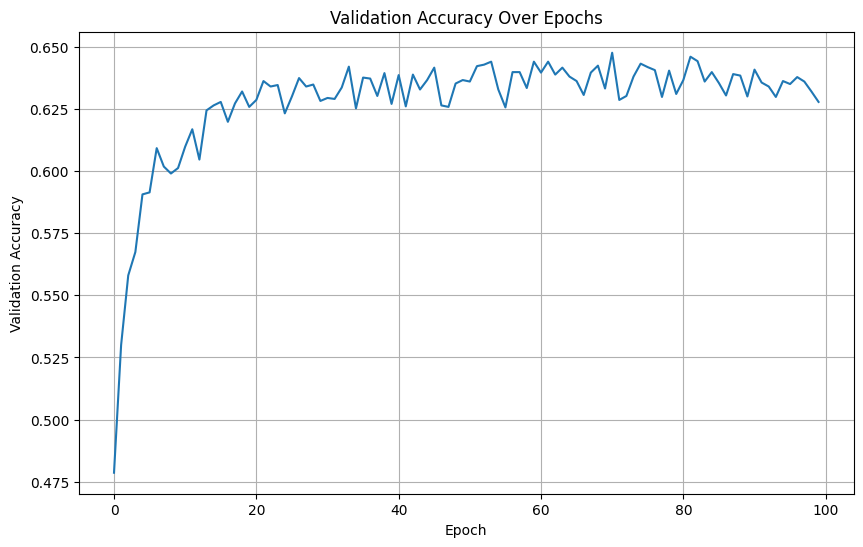

In [16]:
# Plot validation accuracy over epochs
plt.figure(figsize=(10, 6))
plt.plot(history.history['val_accuracy'])
plt.title('Validation Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.grid(True)
plt.show()

## Classifier using augmented dataset

In [17]:
# augmented data set 1 : brightening every pixel by one
# Brighten every pixel in every image by 10%
aug_set_1 = np.minimum(1.1 * X_train_normalized, 1)

# Darken every pixel in every image by 10%
aug_set_2 = 0.9 * X_train_normalized

# Flip all images horizontally (mirrored)
aug_set_3 = np.flip(X_train_normalized, axis=2)

aug_set_4 = X_train_normalized





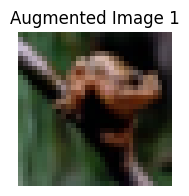

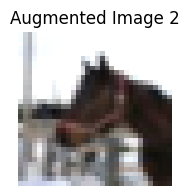

In [18]:
import matplotlib.pyplot as plt


num_images_to_visualize = 2

for i in range(num_images_to_visualize):
    plt.figure(figsize=(2, 2))
    plt.imshow(aug_set_1[i].reshape(32, 32, 3))
    plt.axis('off')
    plt.title(f'Augmented Image {i+1}')
    plt.show()

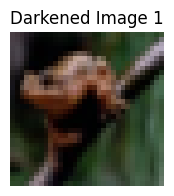

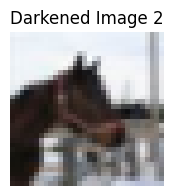

In [19]:

num_images_to_visualize = 2

for i in range(num_images_to_visualize):
    plt.figure(figsize=(2, 2))
    plt.imshow(aug_set_3[i].reshape(32, 32, 3))
    plt.axis('off')
    plt.title(f'Darkened Image {i+1}')
    plt.show()

In [ ]:
X_train_normalized.shape

In [20]:
merged_augmented_data = np.concatenate([aug_set_1, aug_set_2, aug_set_3, aug_set_4], axis=0)

In [ ]:
del aug_set_1, aug_set_2, aug_set_3, aug_set_4

In [21]:
merged_augmented_data.shape

(180000, 32, 32, 3)

In [22]:
merged_augmented_data_new = (merged_augmented_data + 1) / 2

In [23]:
# Stack up three copies of y_train below itself
y_train_stacked = np.concatenate([y_train] * 4)


In [ ]:
y_train_stacked.shape

In [24]:


# Initialize the model
model_2 = Sequential()

# 1st 2D Convolutional Layer with 10 kernels of size 5x5x3 and ReLU activation
model_2.add(Conv2D(10, (5, 5), strides=(1, 1), input_shape=(32, 32, 3), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# 2nd 2D Convolutional Layer with 10 kernels of size 5x5x10 and ReLU activation
model_2.add(Conv2D(10, (5, 5), strides=(1, 1), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Flatten the final feature map before the fully connected layers
model_2.add(Flatten())

# 1st Fully Connected Layer with 20 neurons and ReLU activation
model_2.add(Dense(20, activation='relu', kernel_initializer=he_normal()))

# 2nd Fully Connected Layer with 10 neurons for softmax activation (10 classes)
model_2.add(Dense(10, activation='softmax', kernel_initializer=he_normal()))

# Compile the model
model_2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_2.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 10)        760       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 10)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 10, 10, 10)        2510      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 5, 5, 10)          0         
 g2D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 250)               0         
                                                                 
 dense_2 (Dense)             (None, 20)               

In [26]:
model_2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


history_2 = model_2.fit(merged_augmented_data_new, y_train_stacked, epochs=200, batch_size=256, validation_data=(X_validation_normalized_new, y_validation))


Epoch 1/200
704/704 [==============================] - 5s 5ms/step - loss: 2.1565 - accuracy: 0.2000 - val_loss: 2.5067 - val_accuracy: 0.2048
Epoch 2/200
704/704 [==============================] - 3s 4ms/step - loss: 1.9727 - accuracy: 0.2646 - val_loss: 2.4849 - val_accuracy: 0.2236
Epoch 3/200
704/704 [==============================] - 3s 4ms/step - loss: 1.9088 - accuracy: 0.2815 - val_loss: 2.7140 - val_accuracy: 0.2350
Epoch 4/200
704/704 [==============================] - 3s 4ms/step - loss: 1.8640 - accuracy: 0.2988 - val_loss: 2.9057 - val_accuracy: 0.2448
Epoch 5/200
704/704 [==============================] - 3s 4ms/step - loss: 1.8310 - accuracy: 0.3115 - val_loss: 3.2529 - val_accuracy: 0.2300
Epoch 6/200
704/704 [==============================] - 3s 4ms/step - loss: 1.8005 - accuracy: 0.3226 - val_loss: 4.6072 - val_accuracy: 0.1848
Epoch 7/200
704/704 [==============================] - 3s 4ms/step - loss: 1.6879 - accuracy: 0.3759 - val_loss: 6.6093 - val_accuracy: 0.1600

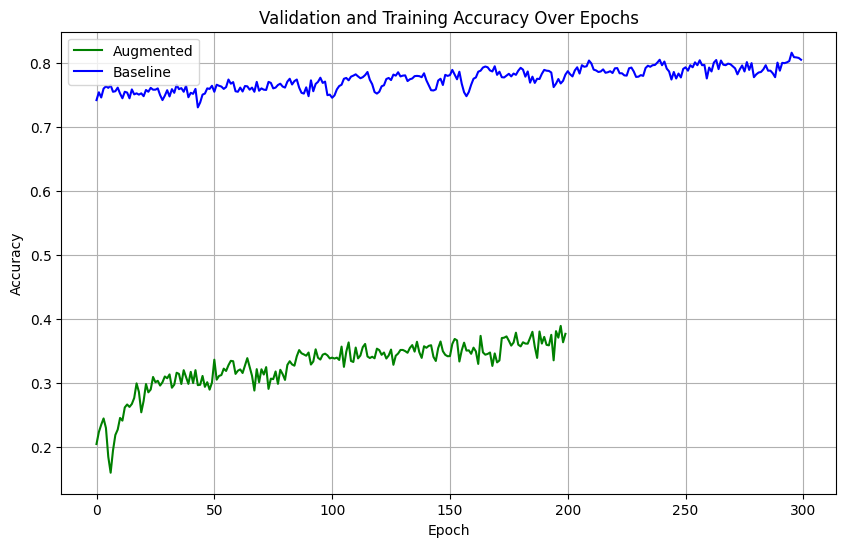

In [91]:
import matplotlib.pyplot as plt

# Assuming you have compiled and trained your models and obtained the history objects 'history_2' and 'history'

# Plot validation accuracy and training accuracy over epochs
plt.figure(figsize=(10, 6))
plt.plot(history_2.history['val_accuracy'], label='Augmented', color='green')
plt.plot(history.history['accuracy'], label='Baseline', color='blue')
plt.title('Validation and Training Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()



#### conclusions:
* The augmented model should outperform the baseline but here it is not seen that.
* Possible reasons can be :
- Overfitting: Augmenting the data increases its size and diversity, but it also increases the risk of overfitting, especially if the model is complex. The model might become too specific to the augmented training data and fail to generalize well to unseen data.

Augmentation Quality: The quality of data augmentation matters. If the augmentation techniques are not applied correctly or if they distort the original data too much, the model might have difficulty learning meaningful patterns from the augmented images.

Hyperparameters: The learning rate, batch size, and other hyperparameters used during training can significantly affect the model's performance. These hyperparameters might need to be tuned differently when using augmented data.

Model Architecture: The architecture of the neural network plays a crucial role. If the model is not deep enough or lacks the capacity to learn from the augmented data, it might not benefit much from the additional training examples.

# Problem 4

## Pretext task

In [ ]:
#(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

In [28]:
# Reshape the training, validation, and test data to 32x32x3 tensors
X_train_reshaped = X_trainn.reshape(-1, 3, 32, 32).transpose(0, 2, 3, 1)

X_test_reshaped = X_test.reshape(-1, 3, 32, 32).transpose(0, 2, 3, 1)

In [29]:
X_train_reshaped.shape

(50000, 32, 32, 3)

In [5]:
x_baseline = X_train_reshaped[-500:]
y_baseline = y_trainn[-500:]


# class 0
x_pretext = X_train_reshaped[:-500]
y_pretext = y_trainn[:-500]

In [30]:
x_baseline.shape

(500, 32, 32, 3)

In [6]:
# class 1
x_pretext_flipped = []
x_pretext_rot = []
for im in x_pretext:
    x_pretext_flipped.append(tf.image.flip_up_down(im))
    x_pretext_rot.append(tf.image.rot90(im))

In [7]:
x_pretext_flipped = np.array(x_pretext_flipped)
x_pretext_rotate = np.array(x_pretext_rot)

In [31]:
 x_pretext_flipped.shape

(49500, 32, 32, 3)

In [9]:


# Initialize the model
model_3 = Sequential()

# 1st 2D Convolutional Layer with 10 kernels of size 5x5x3 and ReLU activation
model_3.add(Conv2D(10, (5, 5), strides=(1, 1), input_shape=(32, 32, 3), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model_3.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# 2nd 2D Convolutional Layer with 10 kernels of size 5x5x10 and ReLU activation
model_3.add(Conv2D(10, (5, 5), strides=(1, 1), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model_3.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Flatten the final feature map before the fully connected layers
model_3.add(Flatten())

# 1st Fully Connected Layer with 20 neurons and ReLU activation
model_3.add(Dense(20, activation='relu', kernel_initializer=he_normal()))

# 2nd Fully Connected Layer with 10 neurons for softmax activation (10 classes)
model_3.add(Dense(3, activation='softmax', kernel_initializer=he_normal()))

# Compile the model
model_3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_3.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 10)        760       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 10)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 10)        2510      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 5, 5, 10)          0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 250)               0         
                                                                 
 dense (Dense)               (None, 20)                5

In [10]:
y_0 = np.zeros((49500,1))
y_1 = np.ones((49500,1))
y_2 = np.ones((49500,1))*2

y_pretext_final = np.vstack((y_0,y_1,y_2))

In [11]:
x_pretext_rotated_new = (x_pretext_rotate / 255.0) * 2 - 1
x_pretext_flipped_new = (x_pretext_flipped / 255.0) * 2 - 1
x_pretext_new = (x_pretext / 255.0) * 2 - 1

In [14]:
x_baseline_new = (x_baseline / 255.0) * 2 - 1
X_test_reshaped = (X_test / 255.0) * 2 - 1

In [32]:
x_pretext_rotated_new.shape

(49500, 32, 32, 3)

In [13]:
x_pretext_final = np.vstack((x_pretext_new,x_pretext_rotated_new,x_pretext_flipped_new))

In [ ]:
del X_train, X_test, x_pretext, y_pretext, x_pretext_flipped, x_pretext_rot, x_pretext_rotate, x_pretext_rotated_new, x_pretext_flipped_new

In [16]:
model_3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model with validation data, storing validation accuracy over epochs
history_3 = model_3.fit(x_pretext_final, y_pretext_final, epochs=100, batch_size=256)


Epoch 1/100
581/581 [==============================] - 13s 4ms/step - loss: 0.8660 - accuracy: 0.5867
Epoch 2/100
581/581 [==============================] - 2s 4ms/step - loss: 0.7618 - accuracy: 0.6579
Epoch 3/100
581/581 [==============================] - 2s 4ms/step - loss: 0.7276 - accuracy: 0.6780
Epoch 4/100
581/581 [==============================] - 2s 4ms/step - loss: 0.7057 - accuracy: 0.6886
Epoch 5/100
581/581 [==============================] - 2s 4ms/step - loss: 0.6892 - accuracy: 0.6976
Epoch 6/100
581/581 [==============================] - 2s 4ms/step - loss: 0.6756 - accuracy: 0.7031
Epoch 7/100
581/581 [==============================] - 2s 4ms/step - loss: 0.6660 - accuracy: 0.7083
Epoch 8/100
581/581 [==============================] - 2s 4ms/step - loss: 0.6587 - accuracy: 0.7114
Epoch 9/100
581/581 [==============================] - 2s 4ms/step - loss: 0.6507 - accuracy: 0.7171
Epoch 10/100
581/581 [==============================] - 2s 4ms/step - loss: 0.6446 - accur

In [39]:
# Save the model weights to a file
model_3.save_weights('model_3_weights.h5')

# Save the training history to a file using the pickle module
import pickle

with open('history_3.pkl', 'wb') as file:
    pickle.dump(history_3.history, file)

# Baseline task

In [37]:
# Initialize the new model (model_4)
model_4 = Sequential()

# 1st 2D Convolutional Layer with 10 kernels of size 5x5x3 and ReLU activation
model_4.add(Conv2D(10, (5, 5), strides=(1, 1), input_shape=(32, 32, 3), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model_4.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# 2nd 2D Convolutional Layer with 10 kernels of size 5x5x10 and ReLU activation
model_4.add(Conv2D(10, (5, 5), strides=(1, 1), kernel_initializer=he_normal(), activation='relu'))

# MaxPooling layer with 2x2 pool size and stride=2
model_4.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Flatten the final feature map before the fully connected layers
model_4.add(Flatten())

# 1st Fully Connected Layer with 20 neurons and ReLU activation
model_4.add(Dense(20, activation='relu', kernel_initializer=he_normal()))

# 2nd Fully Connected Layer with 10 neurons for softmax activation (10 classes)
model_4.add(Dense(10, activation='softmax', kernel_initializer=he_normal()))

# Compile the new model (model_4)
model_4.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the summary of the new model
model_4.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 28, 28, 10)        760       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 14, 14, 10)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 10, 10, 10)        2510      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 5, 5, 10)          0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 250)               0         
                                                                 
 dense_4 (Dense)             (None, 20)               

In [26]:


# # Convert y_baseline to a numpy array
y_baseline = np.array(y_baseline)
y_test = np.array(y_test)




In [36]:
X_test_reshaped.shape

(10000, 32, 32, 3)

In [38]:
model_4.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model with validation data, storing validation accuracy over epochs
history_4 = model_4.fit(x_baseline_new, y_baseline, epochs=10000, batch_size=500,validation_freq = 100, validation_data = (X_test_reshaped, y_test))

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 10ms/step - loss: 1.7114e-06 - accuracy: 1.0000
Epoch 7502/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.7099e-06 - accuracy: 1.0000
Epoch 7503/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.7090e-06 - accuracy: 1.0000
Epoch 7504/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.7080e-06 - accuracy: 1.0000
Epoch 7505/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.7064e-06 - accuracy: 1.0000
Epoch 7506/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.7056e-06 - accuracy: 1.0000
Epoch 7507/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.7044e-06 - accuracy: 1.0000
Epoch 7508/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.7030e-06 - accuracy: 1.0000
Epoch 7509/10000
1/1 [==============================] - 0s 15ms/step - loss: 1.7021e-06 - accuracy: 1.0000
Epoch

In [40]:
model_4.save('model_4.keras')

In [41]:
import pickle

with open('history_4.pkl', 'wb') as file:
    pickle.dump(history_4.history, file)

# Save the model weights to a file
model_4.save_weights('model_4_weights.h5')

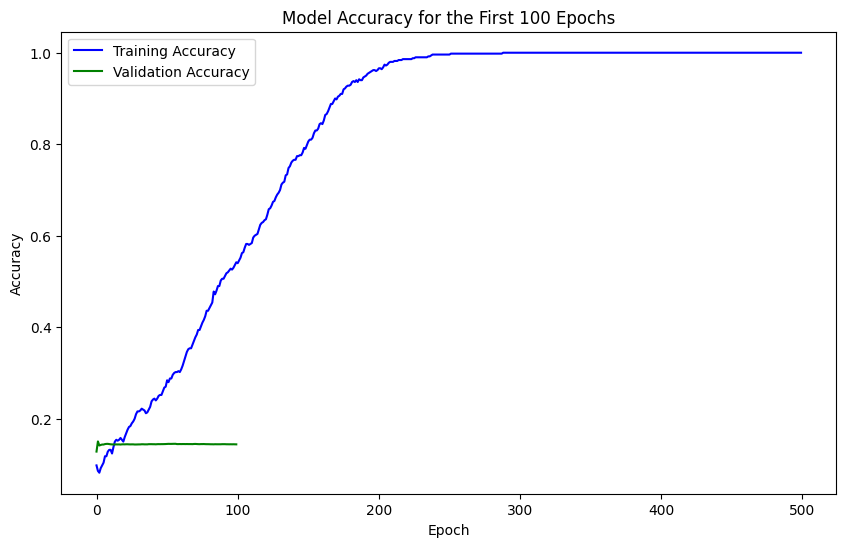

In [44]:
# Assuming you have already trained the model and obtained the history object 'history_4'

# Plot training & validation accuracy values for the first 100 epochs
plt.figure(figsize=(10, 6))
plt.plot(history_4.history['accuracy'][:500], label='Training Accuracy', color='blue')
plt.plot(history_4.history['val_accuracy'][:100], label='Validation Accuracy', color='green')
plt.title('Model Accuracy for the First 100 Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


# Transfer learning task

In [46]:
%%capture
!pip install tensorflow-addons

In [47]:
import tensorflow as tf
import tensorflow_addons as tfa

# Define the pretext model architecture
model_5 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10, kernel_size=(5, 5), input_shape=(32, 32, 3), strides=(1, 1), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.MaxPool2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(10, kernel_size=(5, 5), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.MaxPool2D((2, 2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(20, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dense(10, activation=None, kernel_initializer='he_normal', name='last_layer')
])

# Load weights from the pretext model
#model_3 = tf.keras.models.load_model('model_3.keras')

# Loop through the shared layers and transfer the weights
for i in range(len(model_5.layers) - 1):  # excluding the last layer
    model_5.layers[i].set_weights(model_3.layers[i].get_weights())



# Define optimizers for the last layer and the remaining layers
optimizers = [
    tf.keras.optimizers.Adam(learning_rate=1e-6),  # Optimizer for remaining layers
    tf.keras.optimizers.Adam(learning_rate=1e-3)   # Optimizer for the last layer
]
optimizers_and_layers = [(optimizers[0], model_5.layers[:-1]), (optimizers[1], model_5.layers[-1])]
optimizer = tfa.optimizers.MultiOptimizer(optimizers_and_layers)

# Compile the model with MultiOptimizer and appropriate loss function
model_5.compile(optimizer=optimizer, loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

# Assuming you have 'last_500', 'last_500_labels', 'test_images', and 'test_labels' loaded


model_5.summary()


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 28, 28, 10)        760       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 14, 14, 10)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 10, 10, 10)        2510      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 5, 5, 10)          0         
 g2D)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 250)               0         
                                                                 
 dense_6 (Dense)             (None, 20)               

In [48]:

# Train the transfer learning model
history_5 = model_5.fit(x_baseline_new, y_baseline, epochs=10000, batch_size=500,
                                      validation_data=(X_test_reshaped, y_test), validation_freq=100)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 10ms/step - loss: 1.1878 - accuracy: 0.5760
Epoch 7502/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.1877 - accuracy: 0.5760
Epoch 7503/10000
1/1 [==============================] - 0s 13ms/step - loss: 1.1877 - accuracy: 0.5760
Epoch 7504/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.1876 - accuracy: 0.5760
Epoch 7505/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.1876 - accuracy: 0.5760
Epoch 7506/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.1875 - accuracy: 0.5760
Epoch 7507/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.1874 - accuracy: 0.5760
Epoch 7508/10000
1/1 [==============================] - 0s 9ms/step - loss: 1.1874 - accuracy: 0.5760
Epoch 7509/10000
1/1 [==============================] - 0s 10ms/step - loss: 1.1873 - accuracy: 0.5760
Epoch 7510/10000
1/1 [======================

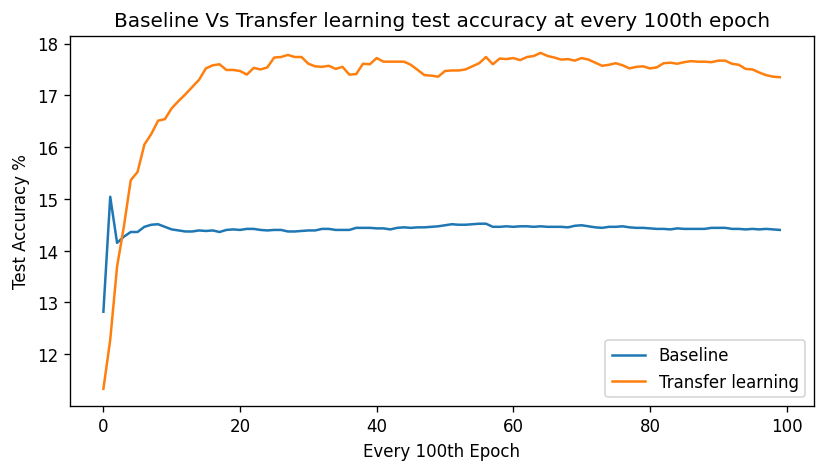

In [49]:
plt.figure(figsize=(8,4),dpi=120)
plt.title('Baseline Vs Transfer learning test accuracy at every 100th epoch')
plt.plot([100*val for val in history_4.history['val_accuracy']],label='Baseline')
plt.plot([100 * val for val in history_5.history['val_accuracy']],label='Transfer learning')
plt.xlabel('Every 100th Epoch')
plt.ylabel('Test Accuracy %')
plt.legend()
plt.show()

## Conclusions:
* It can be seen that transfering the pretrianed model's weights saw a substantial improvemnte in the accuracy and perfromance of the model.
* The plot is for the first 100 epochs.
* The performance is slightly flucurating but more or less stable which indicates that it is not overfitting.

In [ ]:
model_5.save('model_5.keras')

In [51]:
import pickle

with open('history_5.pkl', 'wb') as file:
    pickle.dump(history_5.history, file)

# Save the model weights to a file
model_4.save_weights('model_5_weights.h5')